# YouTube Top Trending Video Analysis Code

Analysis performed by Harleen Kaur and Amelia Meyer

## Packages

In [ ]:
# load packages
import pandas as pd
import numpy as np
import altair as alt
import random

# !pip install wordcloud
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from scipy import linalg

## Read in Tidy-ed Data

In [70]:
# load new csv
trending = pd.read_csv('/Users/harleen/Documents/GitHub/PSTAT100FinalProject/trending.csv')

# print a few example rows of dataset in tidy format
trending.drop(columns=['Unnamed: 0'], inplace=True)

trending.head(4)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,False,False,2020,8,2020,8
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,False,False,2020,8,2020,8
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,False,False,2020,8,2020,8
3,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,XXL,Music,2020-08-12,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,False,False,2020,8,2020,8


## Exploratory Calculations

In [71]:
# visualize number of comments_disabled
disabled = trending.groupby('comments_disabled').size()
disabled

comments_disabled
False    111671
True       1720
dtype: int64

In [72]:
#proportion with comments disabled
disabled[True]/disabled.sum()

0.015168752370117557

In [73]:
trending.head(4)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,False,False,2020,8,2020,8
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,False,False,2020,8,2020,8
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,False,False,2020,8,2020,8
3,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,XXL,Music,2020-08-12,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,False,False,2020,8,2020,8


In [74]:
# visualize number of ratings disabled
trending.groupby('ratings_disabled').size()

ratings_disabled
False    112618
True        773
dtype: int64

In [75]:
# number of unique years
trending.year_trending.unique()

array([2020, 2021, 2022])

In [76]:
# Most viewed video
trending.title.iloc[trending.view_count.idxmax()]

"BTS (방탄소년단) 'Butter' Official MV"

In [77]:
# Most liked video
trending.title.iloc[trending.likes.idxmax()]

"BTS (방탄소년단) 'Butter' Official MV"

In [78]:
# Max dislikes for all trending videos
trending.title.iloc[trending.dislikes.idxmax()]

"BLACKPINK - 'Ice Cream (with Selena Gomez)' M/V"

## Visualization

In [79]:
# to perform graphics on data >5000 observations, we have to disable the max rows altair implements
# alt.data_transformers.disable_max_rows()
# basic scatterplot with large dataset
# alt.Chart(trending).mark_circle().encode(
#    x = 'view_count',
#    y = 'likes'
#)

In [80]:
# take a random sample for visualization
trending_sample = trending.sample(n = 5000)

In [81]:
# create a random seed for reproducibility
random.seed(200)

In [82]:
# create scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample).mark_circle().encode(
    x = alt.X('view_count',scale = alt.Scale(type = 'sqrt')),
    y = 'likes',
    color = 'category',
    size = alt.Size('comment_count')
)

In [83]:
# print scatterplot
likes_v_views

alt.Chart(...)

In [84]:
# create a random seed for reproducibility
random.seed(200)

In [85]:
# create facetted scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample).mark_circle().encode(
    x = 'view_count',
    y = 'likes',
    color = 'category',
    size = alt.Size('comment_count')
).facet(
    column = 'year_trending'
)

In [86]:
# print scatterplot
likes_v_views

alt.FacetChart(...)

In [87]:
# calculate median of sample
sample_med = trending_sample.view_count.median()
sample_med

1090474.5

In [88]:
#We can see some pretty large outliers, so let's modify our plots to zoom in and only show values less than our median
likes_v_views_scaled = likes_v_views.transform_filter(
    alt.FieldLTPredicate(field = 'view_count', lt = sample_med)
)
likes_v_views_scaled

alt.FacetChart(...)

In [89]:
# checking whether there are any times the likes are 0 and ratings are not disabled
trending_sample[(trending_sample.likes == 0) & (trending_sample.ratings_disabled == False)].count()

title                0
date_published       0
channel_name         0
category             0
trending_date        0
tags                 0
view_count           0
likes                0
dislikes             0
comment_count        0
comments_disabled    0
ratings_disabled     0
year_published       0
month_published      0
year_trending        0
month_trending       0
dtype: int64

In [90]:
# create a new dataset with only the videos that have ratings enabled
trending_ratings_enabled = trending_sample[trending_sample.ratings_disabled == False]
trending_ratings_enabled.likes.min()

20

In [91]:
# plot of ratings
alt.Chart(trending_ratings_enabled).transform_filter(
    alt.FieldEqualPredicate(field = 'year_trending', 
                            equal = 2021)
).mark_bar().encode(
    x = alt.X('likes', 
              bin = alt.Bin(step = 50000), 
              title = 'Number of Likes'),
    y = 'count()'
)


alt.Chart(...)

## Exploratory Analysis

In [92]:
# I'm doing this in a copy dataset so as not to alter our original but we can replace it later on if we want

# copy tidy dataset
trending_copy = trending.copy()

In [93]:
# create list of tags for each observation and replace the original tags column with it   
trending_copy["tags"]= trending_copy["tags"].str.split("|")
trending_copy.head(4)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,"[brawadis, prank, basketball, skits, ghost, fu...",1514614,156908,5855,35313,False,False,2020,8,2020,8
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,"[Apex Legends, Apex Legends characters, new Ap...",2381688,146739,2794,16549,False,False,2020,8,2020,8
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,"[jacksepticeye, funny, funny meme, memes, jack...",2038853,353787,2628,40221,False,False,2020,8,2020,8
3,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,XXL,Music,2020-08-12,"[xxl freshman, xxl freshmen, 2020 xxl freshman...",496771,23251,1856,7647,False,False,2020,8,2020,8


In [94]:
# making sure I didn't produce any na's
trending_copy.isna().sum().sum()

0

In [95]:
trending_copy.tags.head(4)

0    [brawadis, prank, basketball, skits, ghost, fu...
1    [Apex Legends, Apex Legends characters, new Ap...
2    [jacksepticeye, funny, funny meme, memes, jack...
3    [xxl freshman, xxl freshmen, 2020 xxl freshman...
Name: tags, dtype: object

In [96]:
# create a giant series of lists of tags
list_of_tags = pd.Series(trending_copy.tags).explode()
list_of_tags

0                                          brawadis
0                                             prank
0                                        basketball
0                                             skits
0                                             ghost
                            ...                    
113389                                 music videos
113389                       songs around the world
113389    playing for change songs around the world
113389                          peace through music
113390                                       [None]
Name: tags, Length: 1886605, dtype: object

In [97]:
trending_copy.tags.isna().sum()

0

In [98]:
# create a text list of all words in column tags
text = " ".join(i for i in trending_copy.tags.astype(str))
# text = " ".join(i for i in data.text)

In [99]:
# set stopwords
stopwords = set(STOPWORDS)
stopwords.update(['None'])

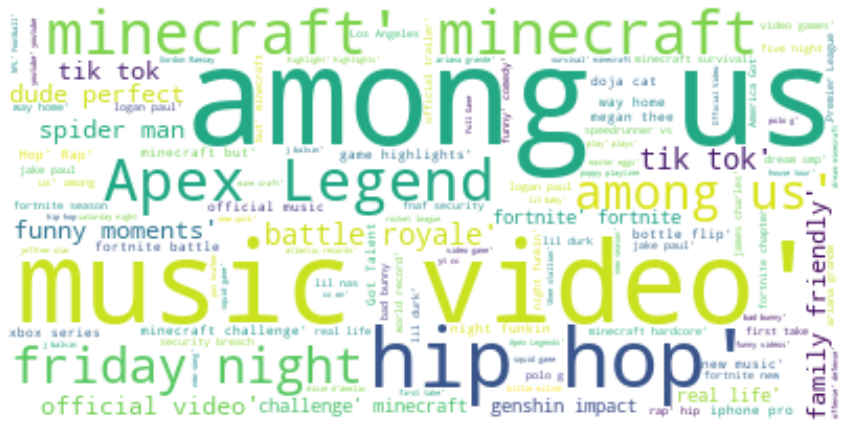

In [100]:
# to update ex: stopwords.update(["bloom", "rose", "petals", "Average", "diameter","flushes", 'throughout', "Blooms", "form"])
# assign wordcloud
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig("wordcloud_tags.png")
plt.show()

Possible further exploration:

word cloud of tags
likes/dislikes ratio vs views
are videos with more dislikes liekly to have their comments off?
change false and true values to 1's and zeroes for the two bool vars

### Correlation Matrix

In [101]:
# dropping title and channel_name as they are essentially row index
x_mx = trending.drop(columns = ['title', 'channel_name', 'year_trending', 'year_published',
                                 'month_trending', 'month_published', 'category', 'date_published', 'trending_date', 'tags'])


In [102]:
# correlation matrix
corr_mx = x_mx.corr()

In [103]:
# melt corr_mx
corr_mx_long = corr_mx.reset_index().rename(
    columns = {'index': 'row'}
).melt(
    id_vars = 'row',
    var_name = 'col',
    value_name = 'Correlation'
)

# construct plot
alt.Chart(corr_mx_long).mark_rect().encode(
    x = alt.X('col', title = '', sort = {'field': 'Correlation', 'order': 'ascending'}), 
    y = alt.Y('row', title = '', sort = {'field': 'Correlation', 'order': 'ascending'}),
    color = alt.Color('Correlation', 
                      scale = alt.Scale(scheme = 'blueorange', # diverging gradient
                                        domain = (-1, 1), # ensure white = 0
                                        type = 'sqrt'), # adjust gradient scale
                     legend = alt.Legend(tickCount = 5)) # add ticks to colorbar at 0.5 for reference
).properties(width = 300, height = 300)

alt.Chart(...)

The correlation matrix tells us that there is a positive relationship between `likes`, `dislikes`, `views`, and `comment_counts`. This means that if one type of video interaction increases, so do others. For example, trending videos with more likes tend to also have a higher amount dislikes despite being the opposite sentiment. Furthermore, `likes` are slightly negatively correlated with `ratings_disabled` and `comments_disabled`. Therefore, the more positive interactions (likes) a video has, the less likely that the videos comments or ratings will be disabled by the channel. Another notable relationship is the positive correlation with `view_count` with `ratings_disabled` and `comments_disabled`. 

### PCA

In [104]:
# center and scale ('normalize')
x_ctr = (x_mx - x_mx.mean())/x_mx.std()

In [106]:
# compute principal components
pca = PCA(n_components = x_ctr.shape[1]) 
pca.fit(x_ctr)

PCA(n_components=6)

In [107]:
# store proportion of variance explained as a dataframe
pca_var_explained = pd.DataFrame({'Proportion of variance explained': pca.explained_variance_ratio_})

# add component number as a new column
pca_var_explained['Component'] = np.arange(1, 7)

# add cumulative variance explained as a new column
pca_var_explained['Cumulative variance explained'] = np.cumsum(pca_var_explained['Proportion of variance explained'])

# print
print(pca_var_explained)

#The variance ratios drop off after 2 components. These first two capture about half of total variation in the data.

   Proportion of variance explained  Component  Cumulative variance explained
0                          0.494481          1                       0.494481
1                          0.195807          2                       0.690288
2                          0.137916          3                       0.828204
3                          0.087627          4                       0.915830
4                          0.065416          5                       0.981247
5                          0.018753          6                       1.000000


In [108]:
# store the loadings as a data frame with appropriate names
loading_df = pd.DataFrame(pca.components_).transpose().rename(
    columns = {0: 'PC1',1: 'PC2',2: 'PC3',3: 'PC4'} # add entries for each selected component
).loc[:, ['PC1', 'PC2','PC3','PC4']] # slice just components of interest

# add a column with the variable names
loading_df["Variable"] = x_ctr.columns
# print
loading_df

,PC1,PC2,PC3,PC4,Variable
0,0.520116,0.031433,0.009068,-0.376386,view_count
1,0.541606,-0.017041,0.010830,0.039824,likes
2,0.476976,0.022239,-0.048570,-0.421372,dislikes
3,0.456517,-0.006415,0.034144,0.822416,comment_count
4,-0.008373,0.707227,-0.704177,0.051509,comments_disabled
5,-0.012579,0.705702,0.707397,-0.013138,ratings_disabled


In [109]:
# melt from wide to long
loading_plot_df = loading_df.melt(
    id_vars = 'Variable',
    var_name = 'Principal Component',
    value_name = 'Loading'
)

# add a column of zeros to encode for x = 0 line to plot
loading_plot_df['zero'] = np.repeat(0, len(loading_plot_df))

# create base layer
base = alt.Chart(loading_plot_df)

# create lines + points for loadings
loadings = base.mark_line(point = True).encode(
    y = alt.X('Variable', title = ''),
    x = 'Loading',
    color = 'Principal Component'
)

# create line at zero
rule = base.mark_rule().encode(x = alt.X('zero', title = 'Loading'), size = alt.value(0.05))

# layer
loading_plot = (loadings + rule).properties(width = 300,height = 500)

# show
loading_plot = loading_plot.facet(column = 'Principal Component')
loading_plot

alt.FacetChart(...)

Lets take a look at which variables influence each principal component.

PC1:  `comment_count`, `view_count`, `dislikes` and `likes`  have the largest positive loading values. Therefore, increasing these values increase the level of PC1. This is consistent with the correlation matrix we constructed earlier. We can conclude that PC1 represents counts of video interactions. 

PC2: High values are coming from videos with comments or ratings disabled. This may describe the positive relationship between videos with interactions disables

PC3: Negative Disabled interaction. High values of `comments_disabled` lower the values of this PC while high values of `ratings_disabled` raises it. This is interesting compared to what we see in PC2. In the correlation matrix we observed that these two variables are positively correlated.

PC4: `comment_count` has a high positive loading. `Dislikes` and `view_count` have a low value.. This PC may also represent a different relationship between video interactions.

### Exploratory analysis based on PCA

In [110]:
# principal component values
pca.fit_transform(x_ctr)

array([[ 0.16498917, -0.14781273,  0.0235748 ,  0.15945083,  0.31972276,
        -0.07822657],
       [ 0.00088789, -0.14774156,  0.02944393,  0.04526407,  0.04026541,
        -0.01206337],
       [ 0.35890535, -0.15974564,  0.04406823,  0.30650872, -0.10134645,
        -0.33254758],
       ...,
       [-0.48968988, -0.15491096,  0.02933406,  0.10052909,  0.08426207,
         0.03171208],
       [-0.30653097, -0.14908574,  0.03292335,  0.02196886, -0.06233891,
         0.1125923 ],
       [-0.46403709, -0.15574962,  0.02959966,  0.09425178,  0.05884791,
        -0.01009136]])

In [111]:
# project data onto first four components; store as data frame
projected_data = pd.DataFrame(pca.fit_transform(x_ctr)).iloc[:, 0:4].rename(columns = {0: 'PC1', 1: 'PC2', 2: 'PC3', 3: 'PC4'})

# add state and county
projected_data[['title', 'channel_name']] = trending[['title', 'channel_name']]

# print
projected_data.head(4)

,PC1,PC2,PC3,PC4,title,channel_name
0,0.164989,-0.147813,0.023575,0.159451,I ASKED HER TO BE MY GIRLFRIEND...,Brawadis
1,0.000888,-0.147742,0.029444,0.045264,Apex Legends | Stories from the Outlands – “Th...,Apex Legends
2,0.358905,-0.159746,0.044068,0.306509,I left youtube for a month and THIS is what ha...,jacksepticeye
3,-0.381315,-0.152197,0.024133,0.085115,XXL 2020 Freshman Class Revealed - Official An...,XXL


In [112]:
# take a random sample for visualization
projected_data_sample = projected_data.sample(n = 5000)

In [113]:
projected_data_sample

,PC1,PC2,PC3,PC4,title,channel_name
108975,-0.263785,-0.142566,0.032833,-0.067784,things you will never unsee... part 3,duck
13429,-0.300747,-0.147981,0.028367,-0.005632,Highlights | Newcastle 1-4 Manchester United |...,Manchester United
60029,0.857143,-0.161586,0.060447,0.536360,JaidenAnimations the Anime,Jaiden Animations
96273,-0.526931,-0.155754,0.027177,0.095077,Dead by Daylight | Everlasting Frost | Collect...,Dead by Daylight
63677,-0.388029,5.635127,-5.735417,0.418669,Piper Rockelle Recreates VIRAL CRUSH PHOTOS,Jordan Matter
...,...,...,...,...,...,...
78569,-0.097386,-0.142067,0.025357,-0.103996,Magnum - Nicky Jam x Jhay Cortez | Video Oficial,NickyJamTV
23440,-0.438861,-0.156144,0.028207,0.115960,Flight - Sum (Official Music Video),FlightReacts
60677,0.546759,-0.137462,0.034226,-0.112296,100 Days - [Minecraft Nether],Luke TheNotable
60193,-0.340285,-0.149953,0.025538,0.011185,*NEW* SEASON 7 Rick & Morty BATTLEPASS In Fort...,Lachlan


In [115]:
# base chart
base = alt.Chart(projected_data_sample)

# data scatter
scatter = base.mark_point(opacity = 0.2).encode(
    x = alt.X('PC1:Q', title = 'PC1'),
    y = alt.Y('PC2:Q', title = 'PC2')
)

# show
scatter

alt.Chart(...)

To better undestand the relationship between video interaction variables (likes, dislikes, comment counts, and views) and disabled interactions, we are comparing PC1 vs PC2. However, there seems to be a lot of outliers in the data that are difficult to explain.